In [1]:
!pip install pandas-profiling -U

     |████████████████████████████████| 261 kB 4.5 MB/s 
     |████████████████████████████████| 596 kB 11.9 MB/s 
     |████████████████████████████████| 675 kB 12.9 MB/s 
     |████████████████████████████████| 62 kB 436 kB/s 
     |████████████████████████████████| 102 kB 6.0 MB/s 
     |████████████████████████████████| 303 kB 31.4 MB/s 
     |████████████████████████████████| 3.1 MB 10.1 MB/s 
     |████████████████████████████████| 10.1 MB 342 kB/s 
     |████████████████████████████████| 812 kB 37.0 MB/s 
     |████████████████████████████████| 38.1 MB 32.6 MB/s 
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=f6d6e279a784e63a123482f881a644bcd09e23f7c120f143b3b75874e9a9dd3b
  Stored in directory: /root/.cache/pip/wheels/70/e1/52/5b14d250ba868768823940c3229e9950d201a26d0bd3ee8655
  Created wheel for imagehash: filename=ImageHash-4.2.1-py2.py3-none-any.whl size=295207 sha256=6ef2612434154c66c609ddde3a5d83f03fb3d685a2bed3cdf90f336425b6318a
  

In [2]:
!pip install feature_engine -U

     |████████████████████████████████| 180 kB 5.3 MB/s 
     |████████████████████████████████| 9.8 MB 33.4 MB/s 
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.10.2
    Uninstalling statsmodels-0.10.2:
      Successfully uninstalled statsmodels-0.10.2


In [3]:
!pip install transformers

     |████████████████████████████████| 3.4 MB 5.2 MB/s 
     |████████████████████████████████| 61 kB 505 kB/s 
     |████████████████████████████████| 895 kB 36.6 MB/s 
     |████████████████████████████████| 3.3 MB 27.1 MB/s 


In [4]:
!git clone https://github.com/maratonadev/desafio-5-2021

Cloning into 'desafio-5-2021'...
remote: Enumerating objects: 36, done.
remote: Total 36 (delta 0), reused 0 (delta 0), pack-reused 36
Unpacking objects: 100% (36/36), done.


In [5]:
import os

import torch
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import stats
from torch import nn, optim
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader
from tqdm import tqdm
import matplotlib.pyplot as plt
from matplotlib import rcParams
from mpl_toolkits.mplot3d import Axes3D
from pandas_profiling import ProfileReport
import plotly.express as px
from sklearn.base import clone
from sklearn.metrics import (f1_score, accuracy_score, 
                             f1_score, confusion_matrix, 
                             classification_report)
from sklearn.svm import SVC
from sklearn.svm import NuSVC
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.model_selection import KFold, cross_val_score, train_test_split
from feature_engine.imputation import MeanMedianImputer, CategoricalImputer, AddMissingIndicator
from feature_engine.encoding import (OrdinalEncoder, OneHotEncoder, 
                                        CountFrequencyEncoder, MeanEncoder,
                                        PRatioEncoder, WoEEncoder)
from feature_engine.discretisation import EqualFrequencyDiscretiser
from transformers import get_linear_schedule_with_warmup
from xgboost import XGBClassifier
import six
import sys
sys.modules['sklearn.externals.six'] = six
from mlxtend.classifier import StackingClassifier as mlxtend_stack

sns.set_theme(style="darkgrid")

%matplotlib inline
random_state = 42

In [55]:
df = pd.read_csv('desafio-5-2021/assets/data/dataset.csv')

In [56]:
df.head()

,ID,GENDER,SENIORCITIZEN,PARTNER,DEPENDENTS,TENURE,PHONESERVICE,MULTIPLELINES,INTERNETSERVICE,ONLINESECURITY,ONLINEBACKUP,DEVICEPROTECTION,TECHSUPPORT,STREAMINGTV,STREAMINGMOVIES,CONTRACT,PAPERLESSBILLING,PAYMENTMETHOD,MONTHLYCHARGES,TOTALCHARGES,CHURN
0,3418,Female,0.0,No,No,26.0,Yes,No,DSL,No,Yes,Yes,No,No,No,Month-to-month,Yes,Credit card (automatic),131.55,1483.7,No
1,6865,Male,0.0,No,No,39.0,Yes,Yes,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Credit card (automatic),79.61,2737.31,No
2,2799,Male,0.0,No,No,1.0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Month-to-month,No,Credit card (automatic),9.26,9.26,No
3,1584,Male,0.0,Yes,Yes,66.0,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,Yes,Credit card (automatic),42.14,1689.19,No
4,9997,Male,0.0,No,No,56.0,Yes,Yes,Fiber optic,No,Yes,No,No,Yes,Yes,Month-to-month,No,Electronic check,126.24,5608.69,No


In [57]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4548 entries, 0 to 4547
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   ID                4548 non-null   int64  
 1   GENDER            4520 non-null   object 
 2   SENIORCITIZEN     4523 non-null   float64
 3   PARTNER           4524 non-null   object 
 4   DEPENDENTS        4526 non-null   object 
 5   TENURE            4533 non-null   float64
 6   PHONESERVICE      4520 non-null   object 
 7   MULTIPLELINES     4523 non-null   object 
 8   INTERNETSERVICE   4524 non-null   object 
 9   ONLINESECURITY    4518 non-null   object 
 10  ONLINEBACKUP      4518 non-null   object 
 11  DEVICEPROTECTION  4524 non-null   object 
 12  TECHSUPPORT       4530 non-null   object 
 13  STREAMINGTV       4523 non-null   object 
 14  STREAMINGMOVIES   4523 non-null   object 
 15  CONTRACT          4525 non-null   object 
 16  PAPERLESSBILLING  4517 non-null   object 


In [58]:
df.describe()

,ID,SENIORCITIZEN,TENURE,MONTHLYCHARGES
count,4548.000000,4523.000000,4533.000000,4527.000000
mean,5478.833773,0.163608,31.812927,95.836351
std,2608.431590,0.369961,24.419055,75.492469
min,1004.000000,0.000000,0.000000,0.090000
25%,3224.750000,0.000000,8.000000,34.645000
50%,5455.500000,0.000000,28.000000,73.530000
75%,7732.250000,0.000000,54.000000,143.595000
max,9999.000000,1.000000,72.000000,345.240000


In [59]:
# Convert TOTALCHARGES variable to numerical
df["TOTALCHARGES"] = pd.to_numeric(df["TOTALCHARGES"], errors='coerce', downcast="float")

In [60]:
# Convert SENIORCITIZEN to categorical
df['SENIORCITIZEN'].replace({0.0: "No", 1.0: "Yes"}, inplace=True)

In [61]:
discrete = [var for var in df.columns if df[var].dtype!='O' and df[var].nunique()<10]
continuous = [var for var in df.columns if df[var].dtype!='O' and var not in discrete]
categorical = [var for var in df.columns if df[var].dtype=='O']

print(f'discrete variables: {len(discrete)}')
print(f'Continuous variables: {len(continuous)}')
print(f'Categorical variables: {len(categorical)}')

discrete variables: 0
Continuous variables: 4
Categorical variables: 17


In [62]:
df.isnull().mean()

ID                  0.000000
GENDER              0.006157
SENIORCITIZEN       0.005497
PARTNER             0.005277
DEPENDENTS          0.004837
TENURE              0.003298
PHONESERVICE        0.006157
MULTIPLELINES       0.005497
INTERNETSERVICE     0.005277
ONLINESECURITY      0.006596
ONLINEBACKUP        0.006596
DEVICEPROTECTION    0.005277
TECHSUPPORT         0.003958
STREAMINGTV         0.005497
STREAMINGMOVIES     0.005497
CONTRACT            0.005057
PAPERLESSBILLING    0.006816
PAYMENTMETHOD       0.006157
MONTHLYCHARGES      0.004617
TOTALCHARGES        0.005277
CHURN               0.000000
dtype: float64

In [63]:
profile = ProfileReport(df)

In [64]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [65]:
rcParams['figure.figsize'] = 14,8

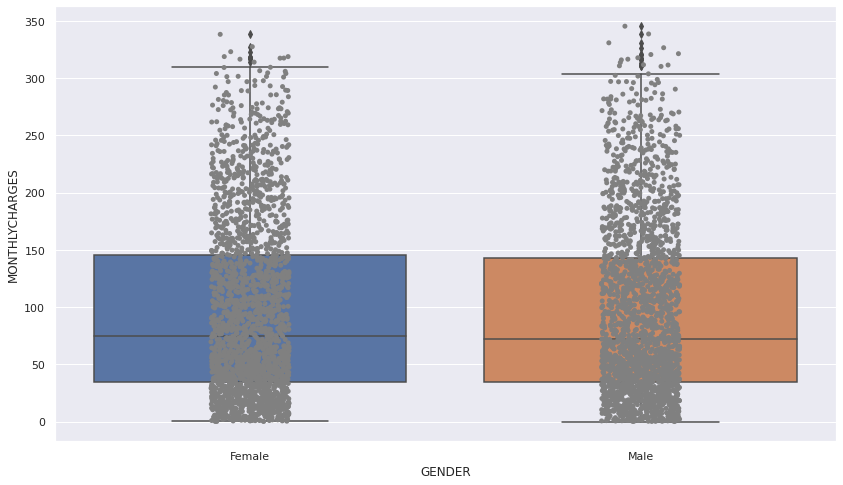

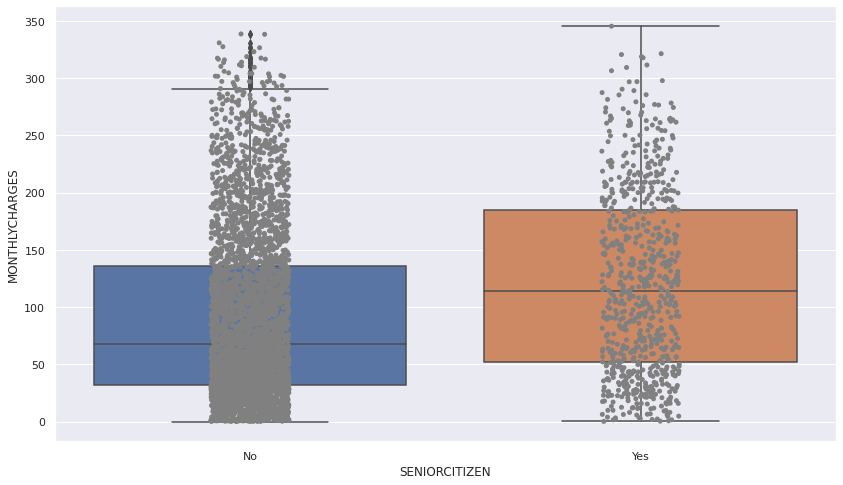

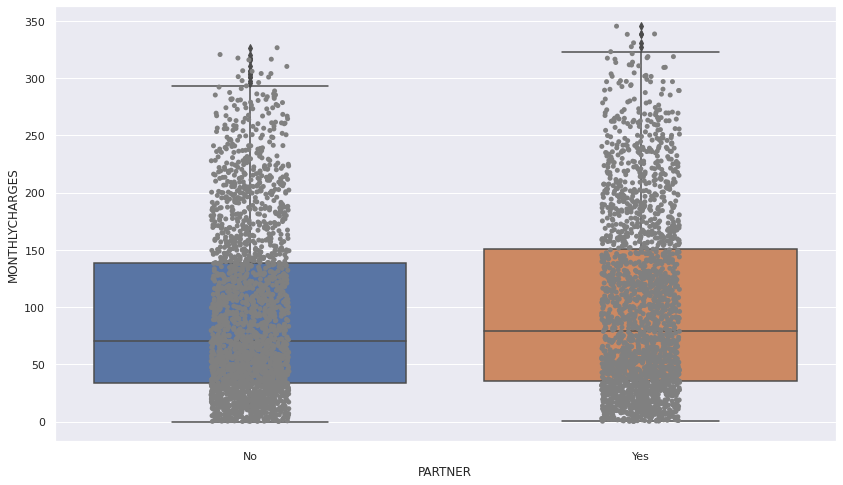

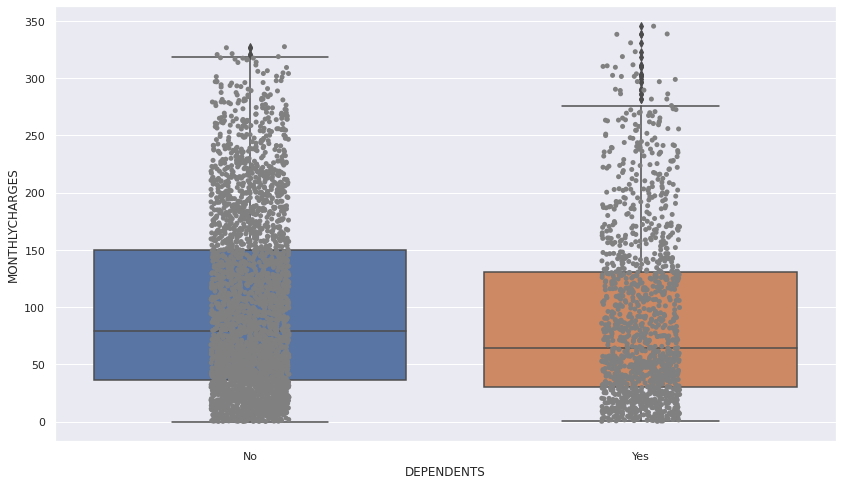

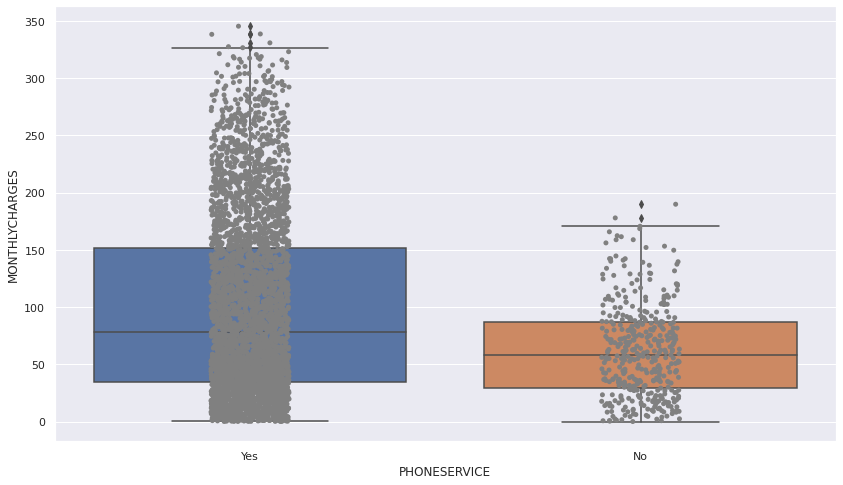

...

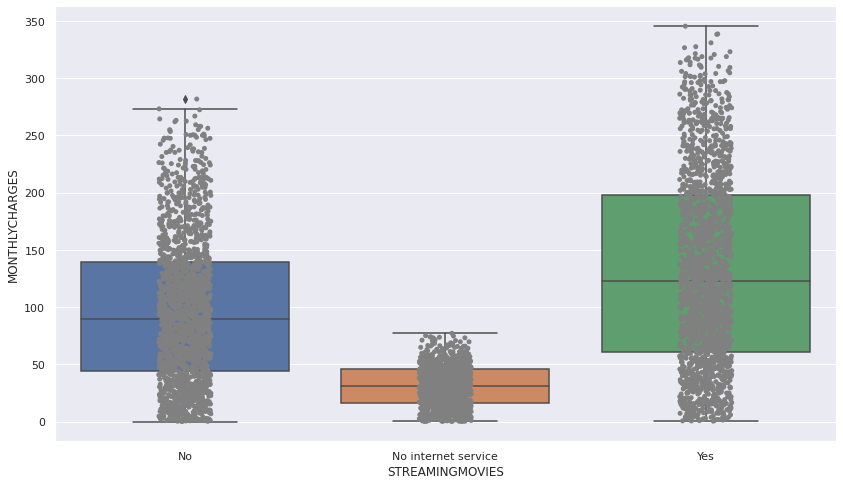

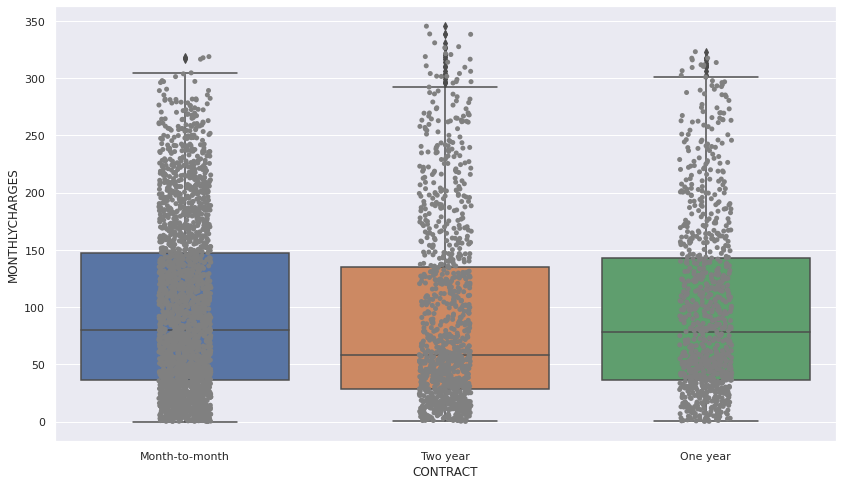

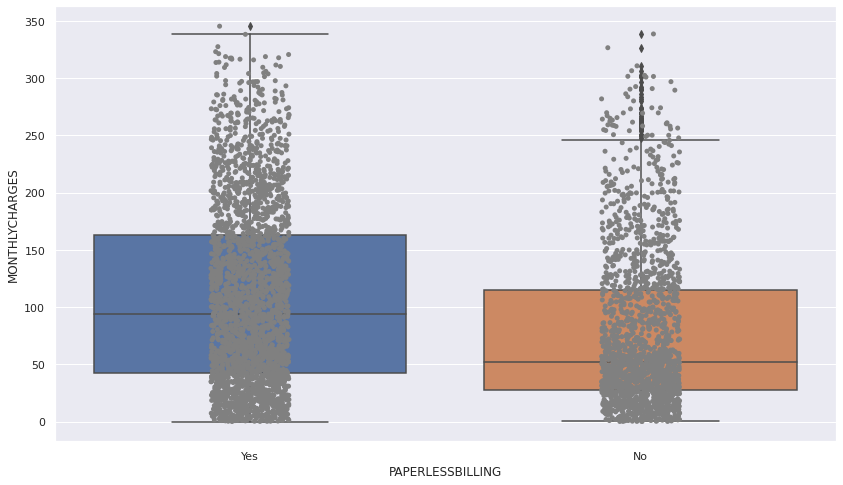

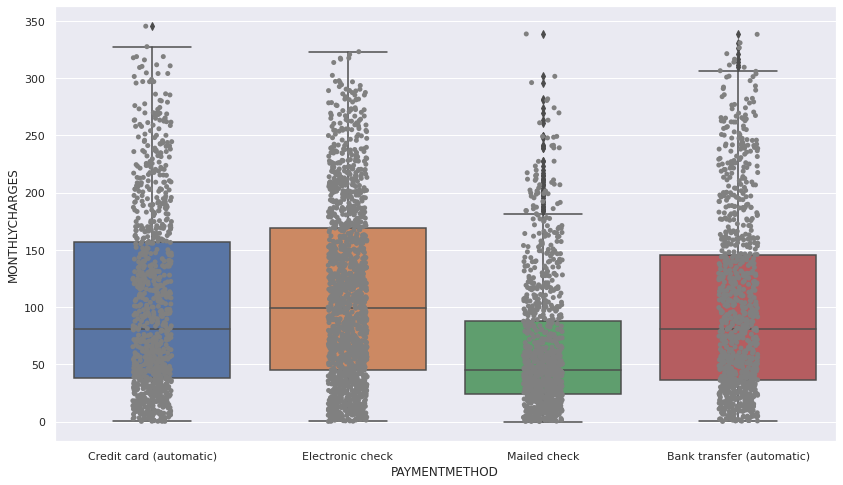

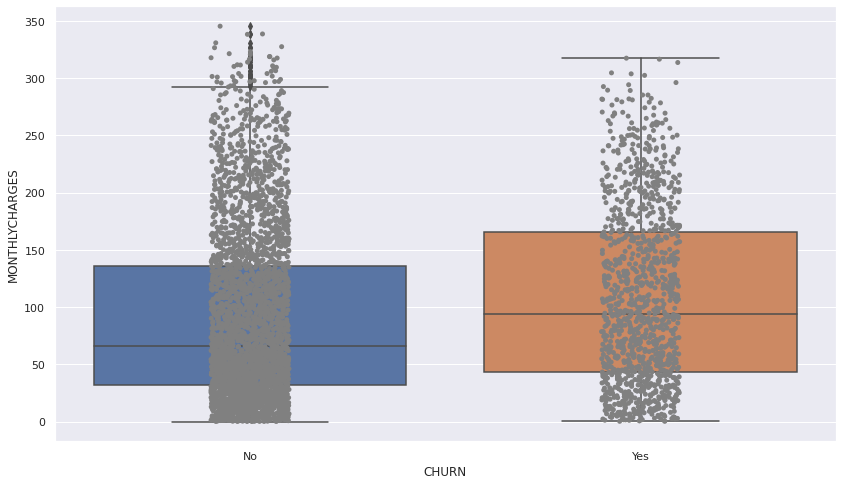

In [66]:
for var in categorical:
    sns.boxplot(x=var, y='MONTHLYCHARGES', data=df)
    sns.stripplot(x=var,y='MONTHLYCHARGES', data=df, color='grey')
    plt.show()

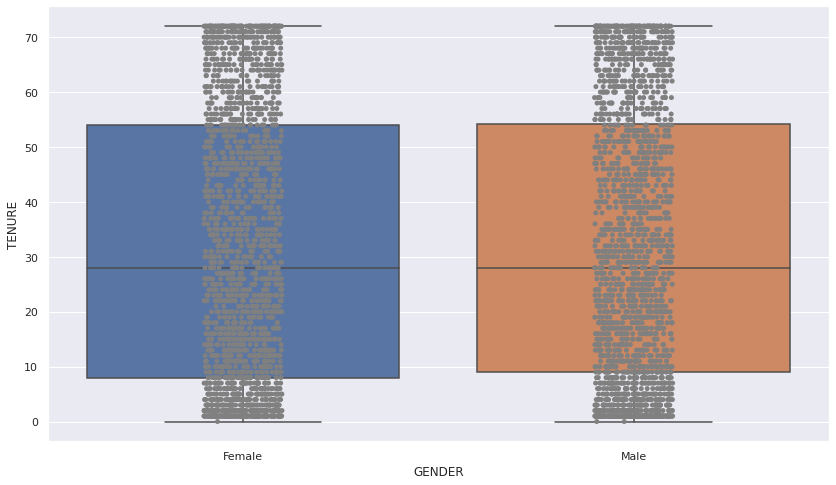

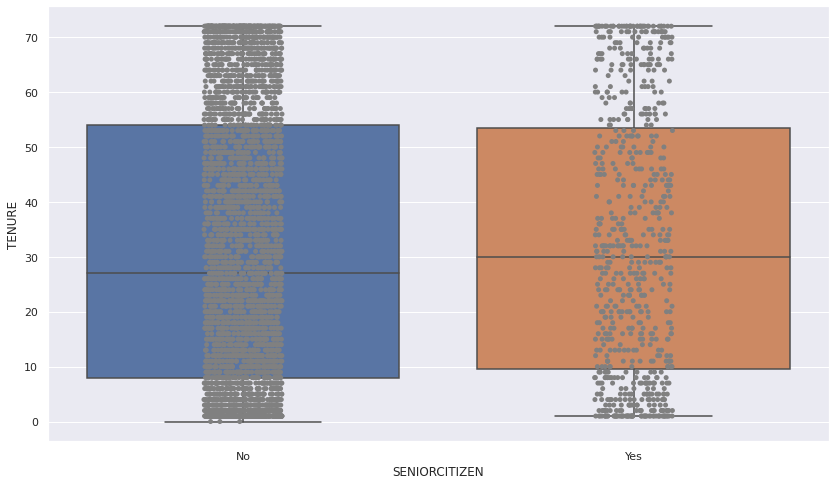

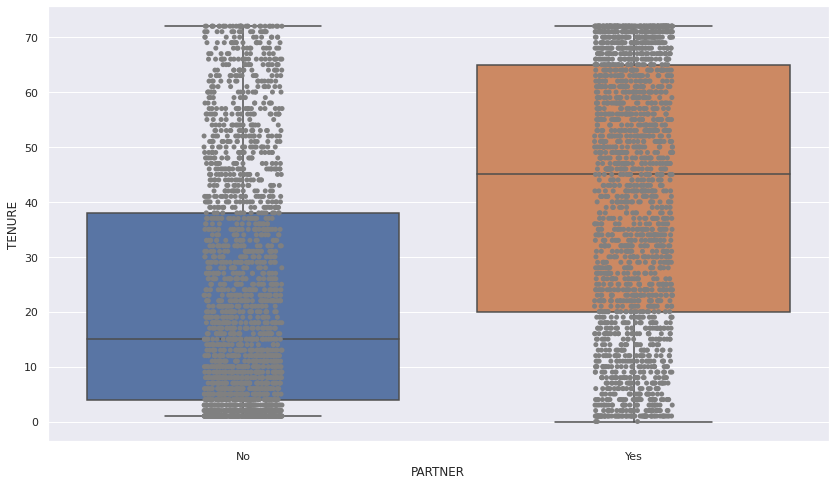

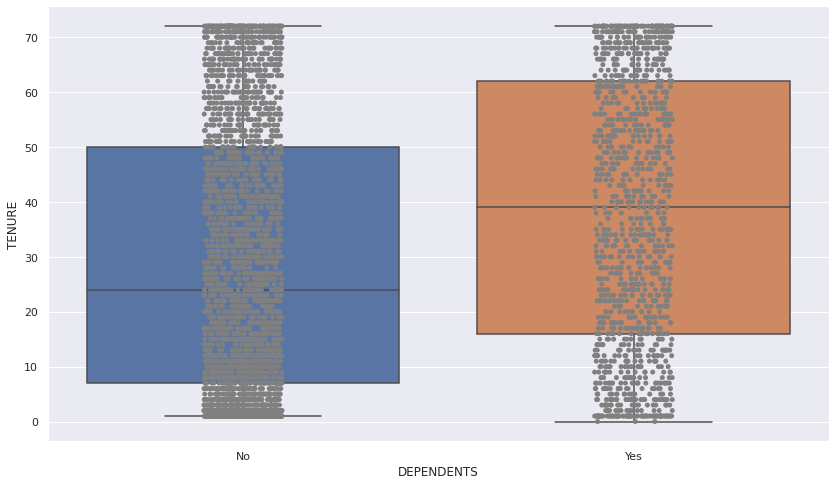

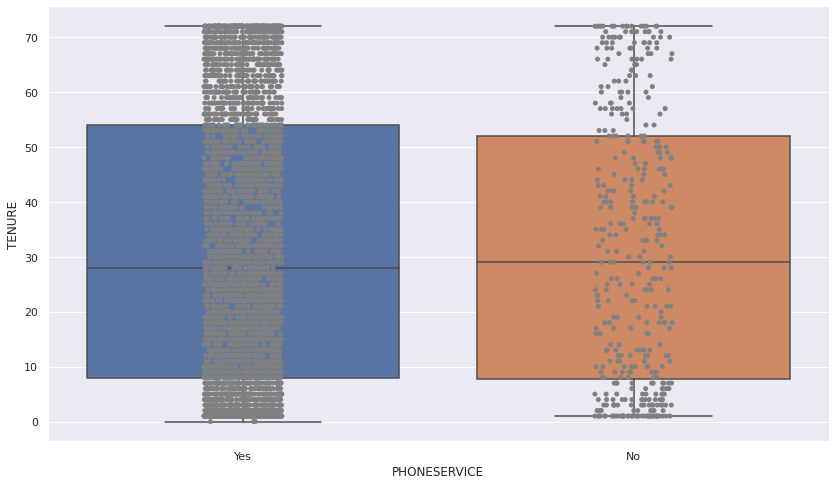

...

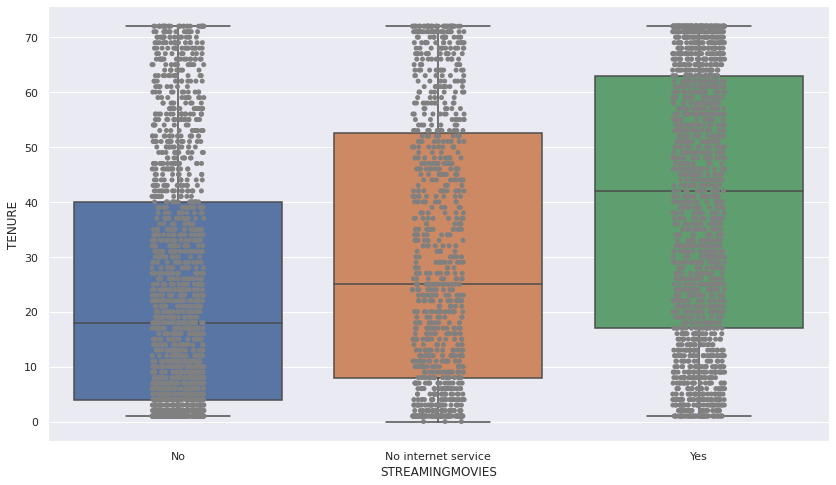

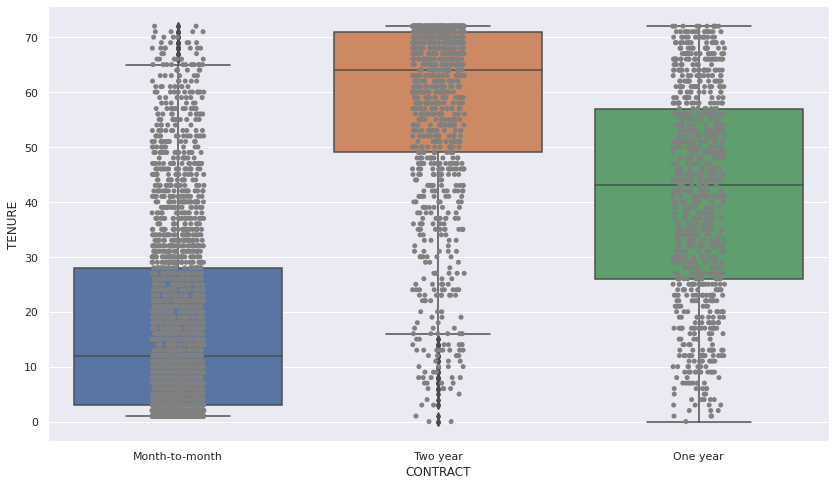

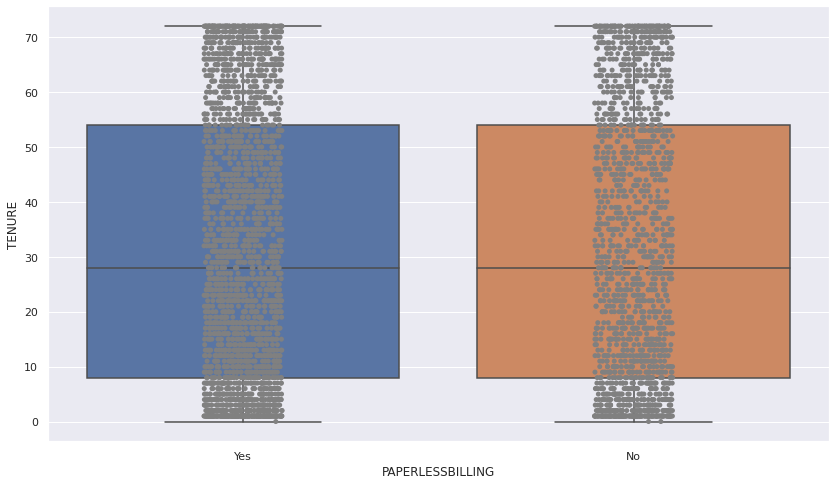

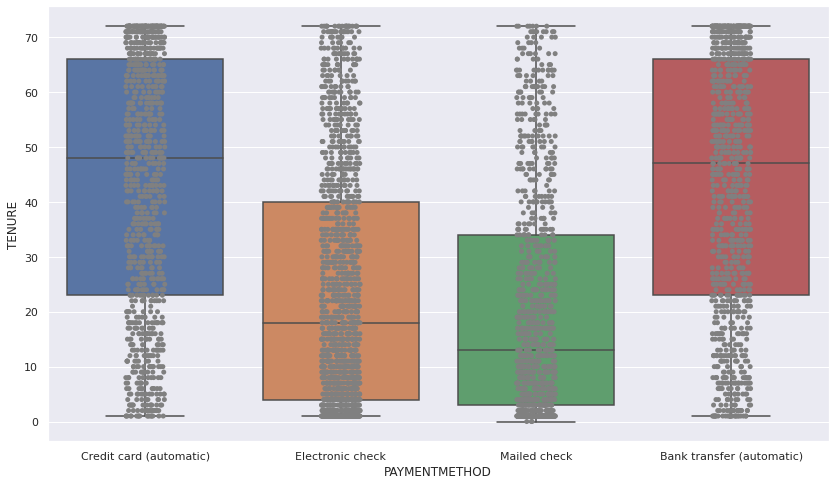

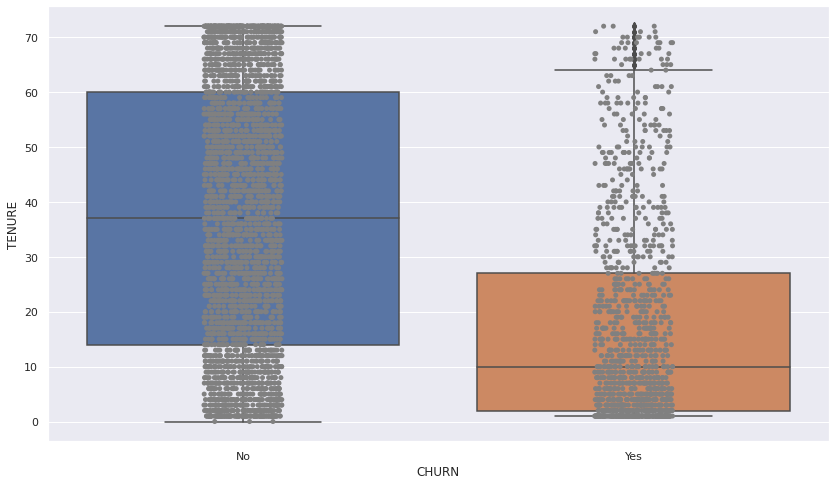

In [67]:
for var in categorical:
    sns.boxplot(x=var, y='TENURE', data=df)
    sns.stripplot(x=var,y='TENURE', data=df, color='grey')
    plt.show()

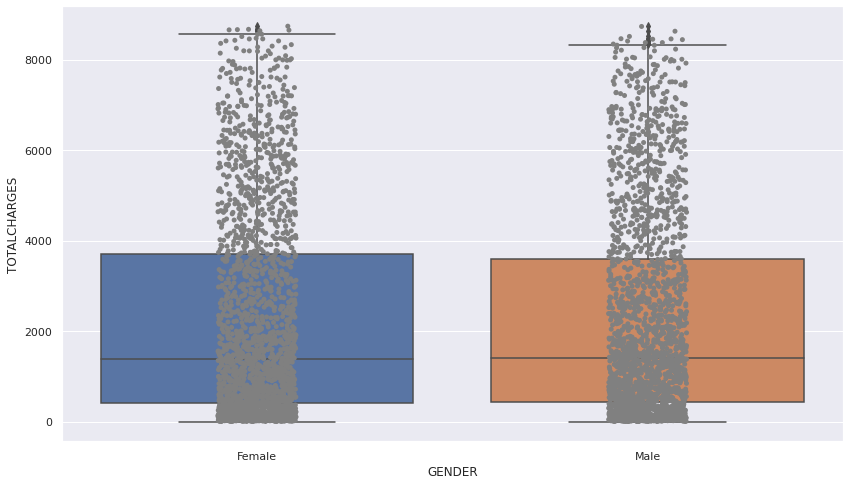

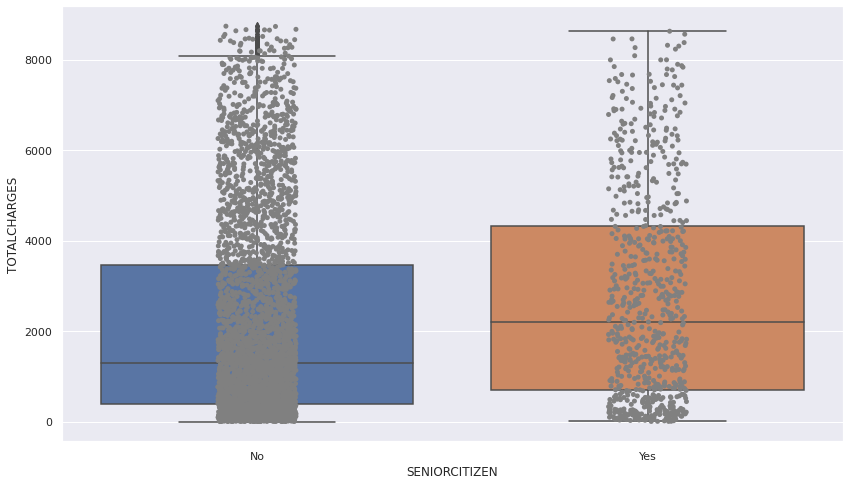

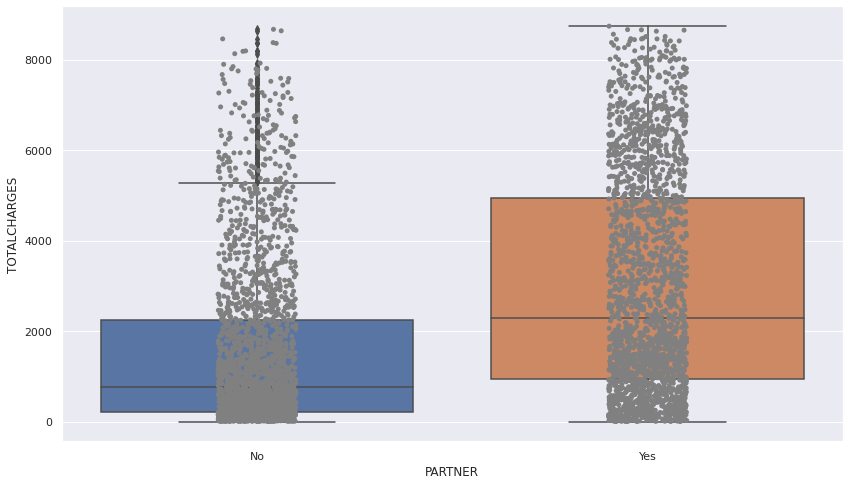

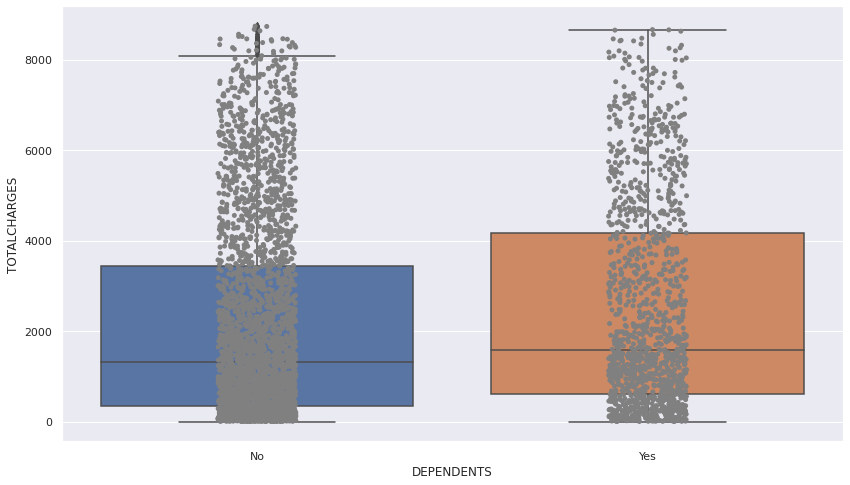

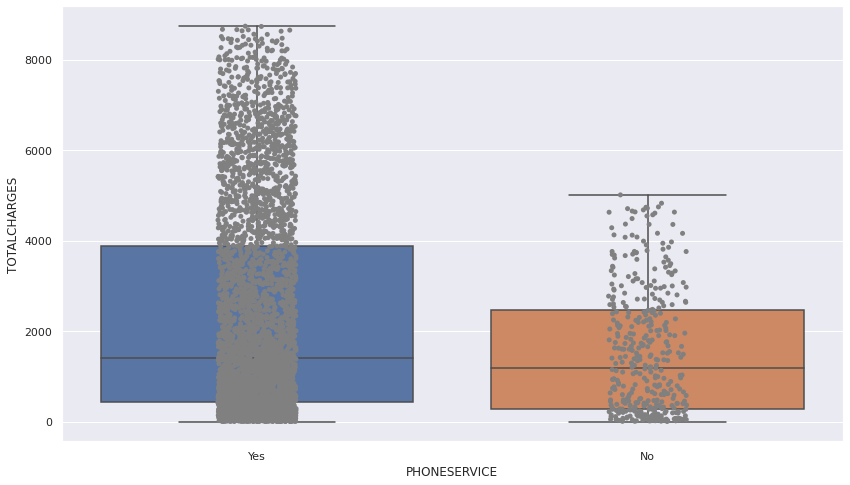

...

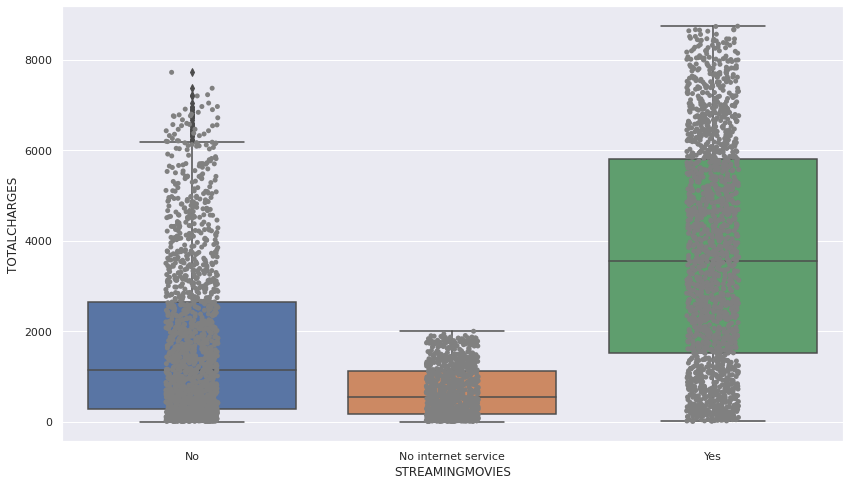

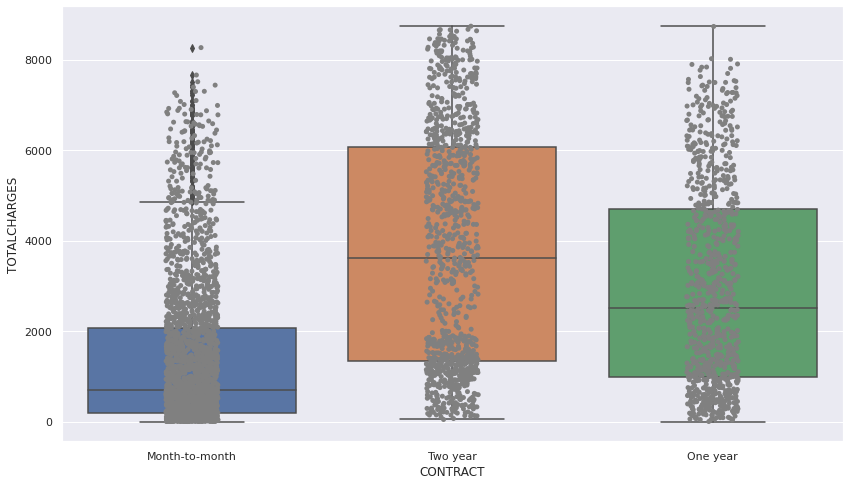

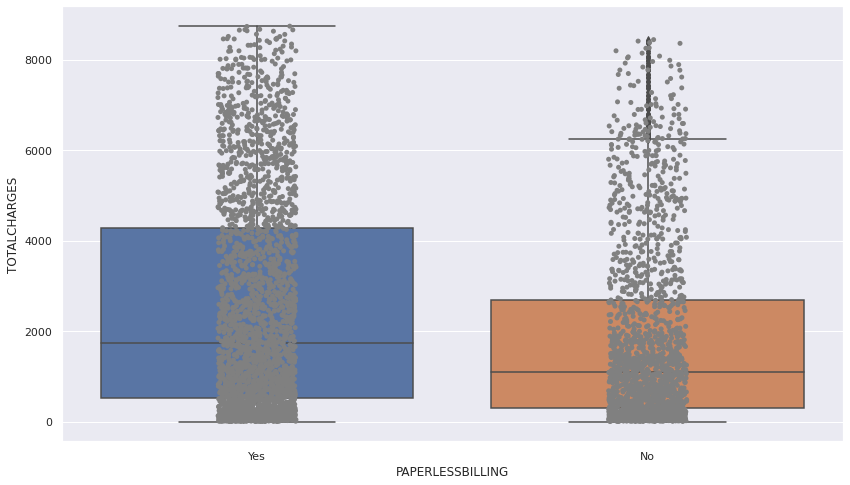

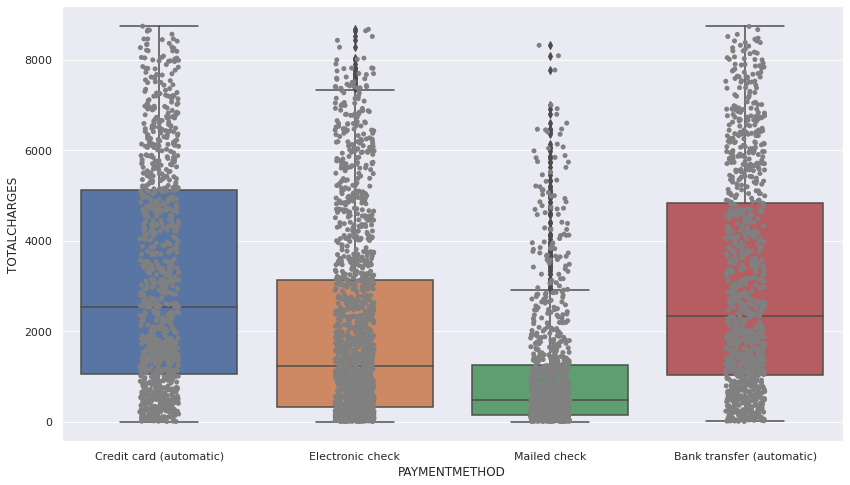

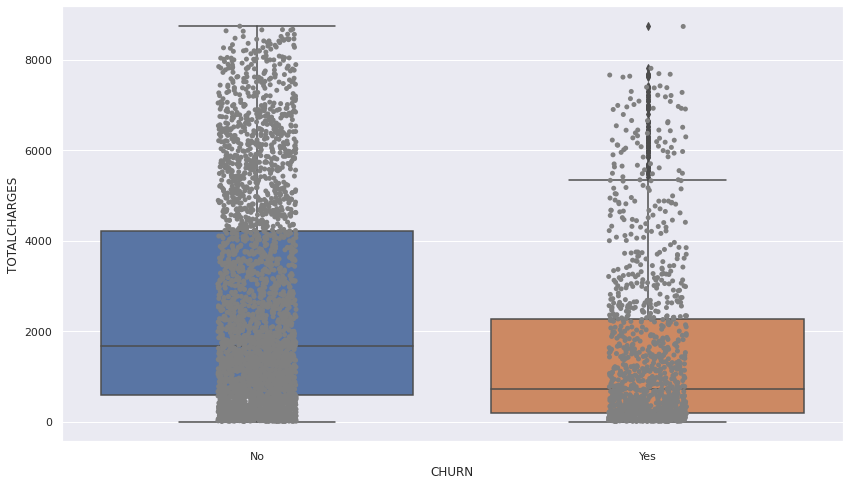

In [68]:
for var in categorical:
    sns.boxplot(x=var, y='TOTALCHARGES', data=df)
    sns.stripplot(x=var,y='TOTALCHARGES', data=df, color='grey')
    plt.show()

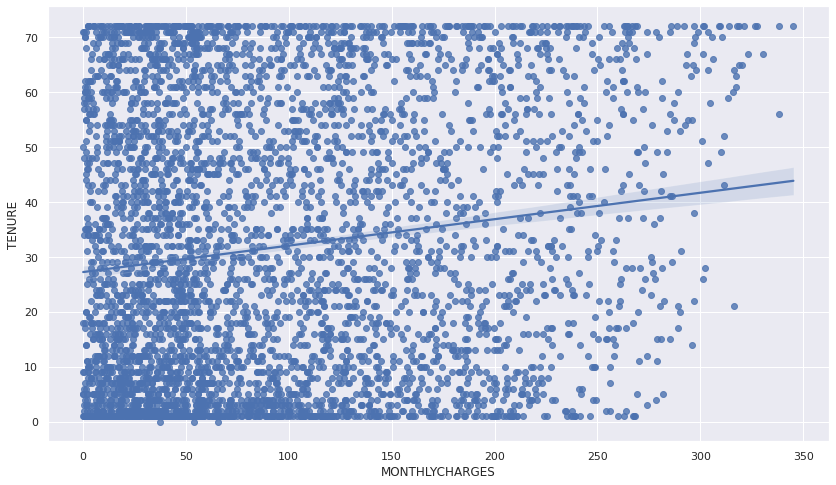

In [69]:
sns.regplot(data=df, x="MONTHLYCHARGES", y="TENURE")

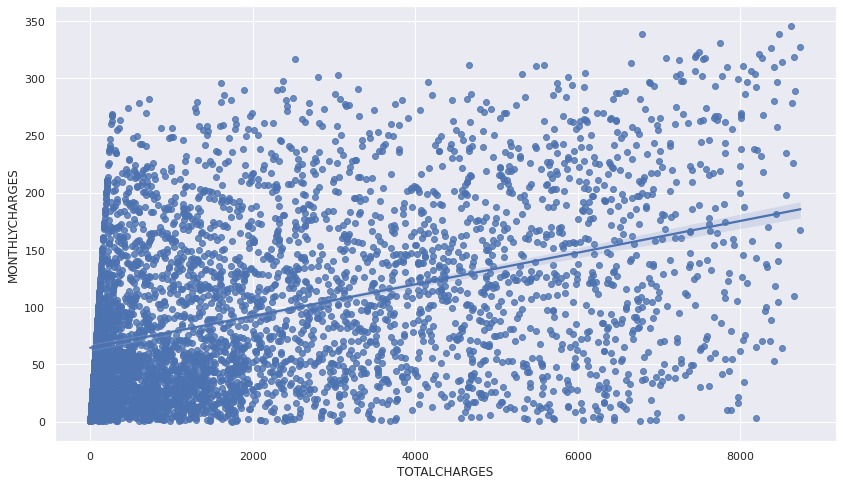

In [70]:
sns.regplot(data=df, x="TOTALCHARGES", y="MONTHLYCHARGES")

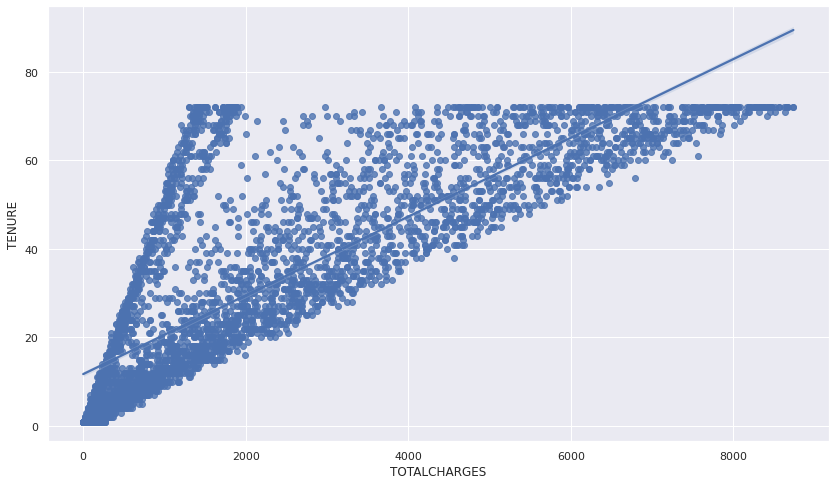

In [71]:
sns.regplot(data=df, x="TOTALCHARGES", y="TENURE")

In [72]:
def check_distribution(df, variable):
    plt.figure(figsize=(16, 4))

    # histogram
    plt.subplot(1, 3, 1)
    sns.histplot(df[variable], bins=30)
    plt.title('Histogram')

    # Q-Q plot
    plt.subplot(1, 3, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.ylabel('Variable quantiles')

    # Box plot
    plt.subplot(1, 3, 3)
    sns.boxplot(y=df[variable], data=df)
    plt.ylabel('Variable quantiles')

    plt.show()

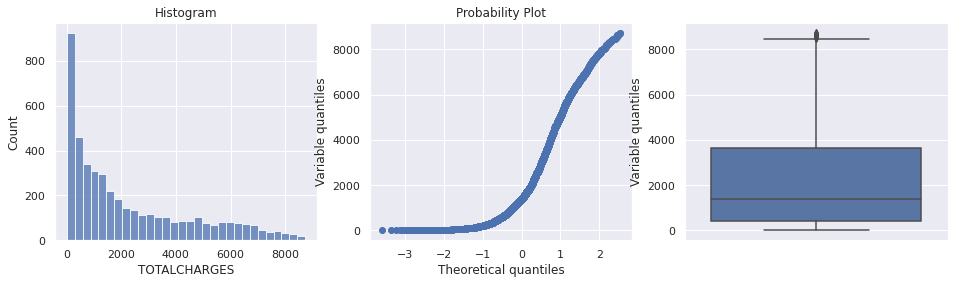

In [73]:
check_distribution(df, 'TOTALCHARGES')

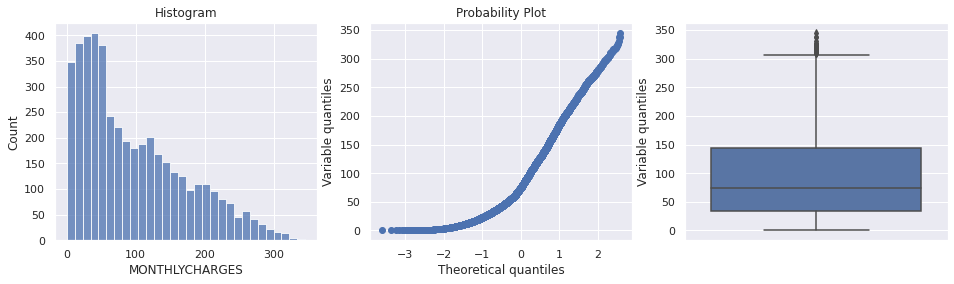

In [74]:
check_distribution(df, 'MONTHLYCHARGES')

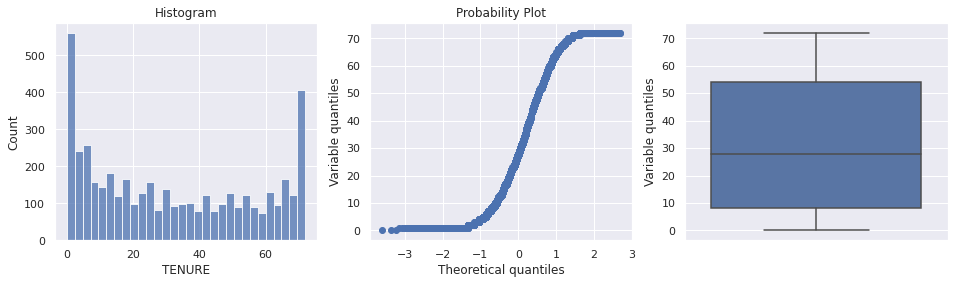

In [75]:
check_distribution(df, 'TENURE')

In [76]:
fig = px.scatter_3d(df, x='TOTALCHARGES', y='MONTHLYCHARGES', z='TENURE')
fig.show()

In [77]:
X_train, X_test, y_train, y_test = train_test_split(df.drop(['CHURN', 'ID'], axis=1),  
                                                        df['CHURN'],  
                                                        test_size=0.2,  
                                                        random_state=42,
                                                        stratify=df['CHURN'])  

In [78]:
len(X_train)

3638

In [79]:
len(X_test)

910

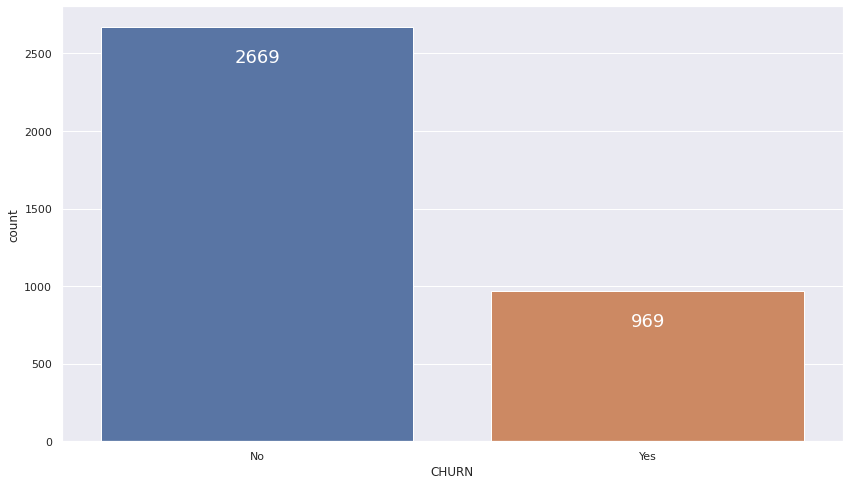

In [80]:
ax = sns.countplot(x="CHURN", data=pd.DataFrame(y_train))

for p in ax.patches:
    ax.annotate(f'\n{p.get_height()}', (p.get_x()+0.4, p.get_height()), ha='center', va='top', color='white', size=18)

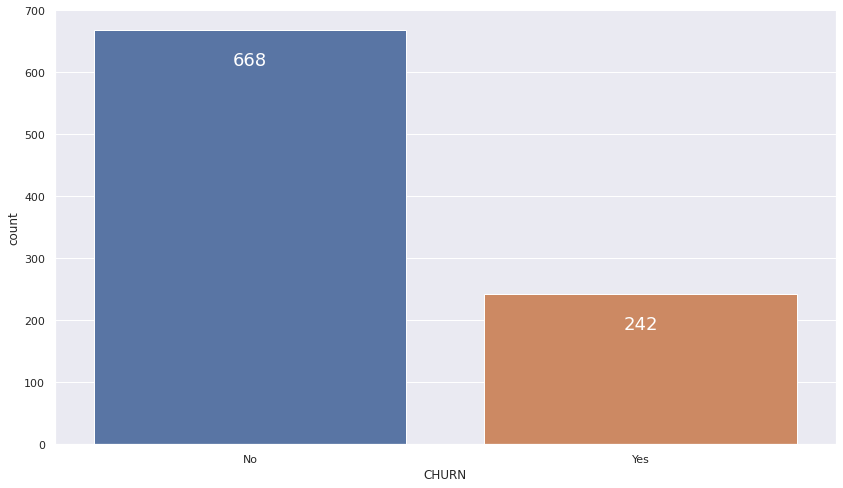

In [81]:
ax = sns.countplot(x="CHURN", data=pd.DataFrame(y_test))

for p in ax.patches:
    ax.annotate(f'\n{p.get_height()}', (p.get_x()+0.4, p.get_height()), ha='center', va='top', color='white', size=18)

In [82]:
X_train.isnull().mean()

GENDER              0.006047
SENIORCITIZEN       0.005772
PARTNER             0.005498
DEPENDENTS          0.005223
TENURE              0.003573
PHONESERVICE        0.006047
MULTIPLELINES       0.005223
INTERNETSERVICE     0.005223
ONLINESECURITY      0.007697
ONLINEBACKUP        0.006872
DEVICEPROTECTION    0.005498
TECHSUPPORT         0.003848
STREAMINGTV         0.005223
STREAMINGMOVIES     0.006047
CONTRACT            0.005498
PAPERLESSBILLING    0.006597
PAYMENTMETHOD       0.005498
MONTHLYCHARGES      0.004398
TOTALCHARGES        0.006047
dtype: float64

In [83]:
data_pipe = Pipeline([

    ('missing_ind', AddMissingIndicator(missing_only=True)),

    ('mean_imputer', MeanMedianImputer(imputation_method='mean', variables=continuous[1:])),

    ('categorical_imputer', CategoricalImputer(imputation_method='missing', variables=categorical[:-1], fill_value='Missing')),

    ('var_encoding', WoEEncoder(variables=categorical[:-1])),

    ('scaler', StandardScaler()),
])

In [84]:
y_train_enc = y_train.replace({"Yes": 1, "No": 0})
y_test_enc = y_test.replace({"Yes": 1, "No": 0})

In [85]:
data_pipe.fit(X_train, y_train_enc)

Pipeline(steps=[('missing_ind', AddMissingIndicator()),
                ('mean_imputer',
                 MeanMedianImputer(imputation_method='mean',
                                   variables=['TENURE', 'MONTHLYCHARGES',
                                              'TOTALCHARGES'])),
                ('categorical_imputer',
                 CategoricalImputer(variables=['GENDER', 'SENIORCITIZEN',
                                               'PARTNER', 'DEPENDENTS',
                                               'PHONESERVICE', 'MULTIPLELINES',
                                               'INTERNETSERVICE',
                                               'ONLINESECURITY', 'ONLINEBACKUP',...
                                               'STREAMINGMOVIES', 'CONTRACT',
                                               'PAPERLESSBILLING',
                                               'PAYMENTMETHOD'])),
                ('var_encoding',
                 WoEEncoder(variables=['GENDER', '

In [86]:
X_train_ = data_pipe.transform(X_train)

In [87]:
X_test_ = data_pipe.transform(X_test)

In [88]:
from imblearn.over_sampling import SMOTE

sm = SMOTE(
    sampling_strategy='auto', 
    random_state=random_state,  
    k_neighbors=5,
    n_jobs=2
)

X_res, y_res = sm.fit_resample(X_train_, y_train_enc)

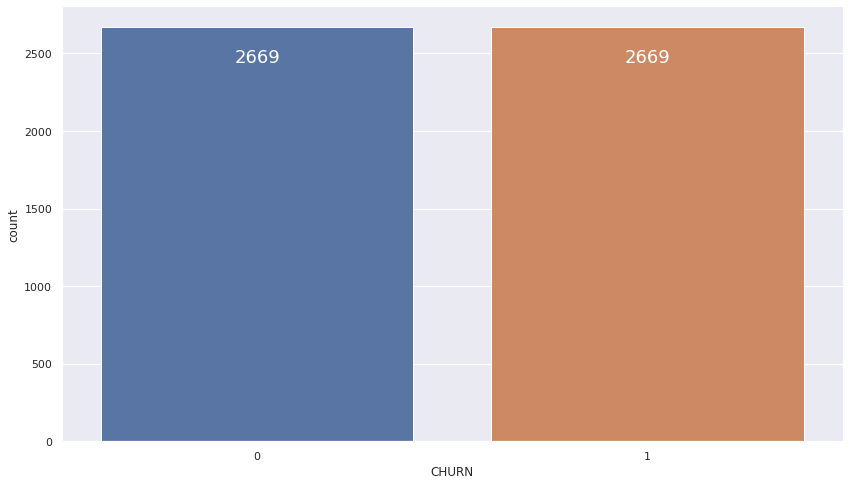

In [89]:
ax = sns.countplot(x="CHURN", data=pd.DataFrame(y_res))

for p in ax.patches:
    ax.annotate(f'\n{p.get_height()}', (p.get_x()+0.4, p.get_height()), ha='center', va='top', color='white', size=18)

In [90]:
rf = RandomForestClassifier(random_state=random_state, 
                                criterion='gini',
                                max_depth=8,
                                max_features='auto',
                                n_estimators=1200)

In [91]:
lr = LogisticRegression(C=0.08, random_state=42)

In [92]:
svc = SVC(degree = 1, kernel='rbf', gamma='auto', random_state=random_state)

In [93]:
nusvc = NuSVC(gamma='auto', kernel="rbf", nu=0.5, random_state=random_state)

In [94]:
xg_boost = XGBClassifier(objective='binary:logistic', learning_rate=0.03, max_depth=4, n_estimators=200, random_state=random_state)

In [95]:
def models_score(models, model_names, X_train, y_train, X_test, y_test):
    models_ = []
    for model, model_name in zip(models, model_names):
        instance = clone(model)
        instance.fit(X_train, y_train)
        train_pred = instance.predict(X_train)
        test_pred = instance.predict(X_test)
        print(f'Model: {model_name} - Acc: {accuracy_score(y_test, test_pred)} | F1: {f1_score(y_test,test_pred)}' )

In [96]:
models_score([rf, lr, svc, nusvc, xg_boost], ['Random Forest', 'Logistic Regression', 'SVC', 'NuSVC', 'XGboost'], X_res, y_res, X_test_, y_test_enc)

Model: Random Forest - Acc: 0.7857142857142857 | F1: 0.6499102333931778
Model: Logistic Regression - Acc: 0.7505494505494505 | F1: 0.6260296540362438
Model: SVC - Acc: 0.734065934065934 | F1: 0.6084142394822006
Model: NuSVC - Acc: 0.734065934065934 | F1: 0.6058631921824105
Model: XGboost - Acc: 0.7923076923076923 | F1: 0.6358381502890174


In [97]:
sclf = mlxtend_stack(classifiers=[rf, svc, nusvc, lr, xg_boost], 
                        meta_classifier=RandomForestClassifier(random_state=random_state, 
                                                                   criterion='gini', max_depth=2,
                                                                    max_features='auto', 
                                                                   n_estimators=200))

In [98]:
sclf.fit(X_res, y_res)

StackingClassifier(classifiers=[RandomForestClassifier(max_depth=8,
                                                       n_estimators=1200,
                                                       random_state=42),
                                SVC(degree=1, gamma='auto', random_state=42),
                                NuSVC(gamma='auto', random_state=42),
                                LogisticRegression(C=0.08, random_state=42),
                                XGBClassifier(learning_rate=0.03, max_depth=4,
                                              n_estimators=200,
                                              random_state=42)],
                   meta_classifier=RandomForestClassifier(max_depth=2,
                                                          n_estimators=200,
                                                          random_state=42))

In [99]:
train_pred = sclf.predict(X_res)
test_pred = sclf.predict(X_test_)
print(f'Train: Acc: {accuracy_score(y_res, train_pred)} | F1: {f1_score(y_res, train_pred)}' )
print(f'Test: Acc: {accuracy_score(y_test_enc, test_pred)} | F1: {f1_score(y_test_enc, test_pred, average="binary")}' )

Train: Acc: 0.8675533907830648 | F1: 0.87277307899946
Test: Acc: 0.7879120879120879 | F1: 0.6522522522522521


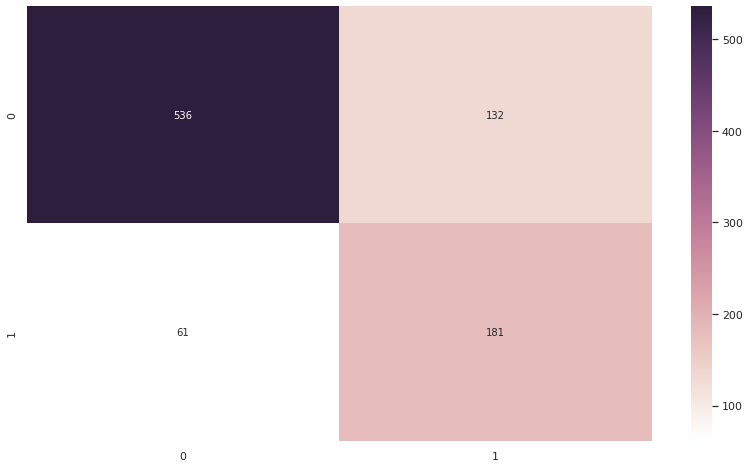

In [100]:
cmap = sns.cubehelix_palette(light=1, as_cmap=True)
sns.heatmap(confusion_matrix(y_test_enc, test_pred), fmt='.0f', cmap=cmap, annot=True)

In [101]:
ans_df = pd.read_csv('desafio-5-2021/assets/data/ANSWERS.csv')

In [102]:
# Convert TOTALCHARGES variable to numerical
ans_df["TOTALCHARGES"] = pd.to_numeric(ans_df["TOTALCHARGES"], errors='coerce', downcast="float")

# Convert SENIORCITIZEN to categorical
ans_df['SENIORCITIZEN'].replace({0.0: "No", 1.0: "Yes"}, inplace=True)

In [103]:
ans_df.head()

,ID,GENDER,SENIORCITIZEN,PARTNER,DEPENDENTS,TENURE,PHONESERVICE,MULTIPLELINES,INTERNETSERVICE,ONLINESECURITY,ONLINEBACKUP,DEVICEPROTECTION,TECHSUPPORT,STREAMINGTV,STREAMINGMOVIES,CONTRACT,PAPERLESSBILLING,PAYMENTMETHOD,MONTHLYCHARGES,TOTALCHARGES,CHURN
0,6946,Female,No,No,No,3,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Month-to-month,No,Electronic check,51.71,90.809998,TO_FILL
1,2228,Male,No,No,No,47,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Bank transfer (automatic),57.05,979.599976,TO_FILL
2,3591,Male,No,Yes,No,62,Yes,Yes,Fiber optic,Yes,Yes,No,No,No,Yes,One year,No,Electronic check,235.56,6140.910156,TO_FILL
3,1153,Male,No,No,Yes,1,Yes,Yes,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,142.25,142.250000,TO_FILL
4,5227,Male,No,No,No,24,Yes,No,DSL,Yes,No,No,Yes,No,No,Month-to-month,No,Electronic check,105.40,1398.949951,TO_FILL


In [104]:
prof_ans = ProfileReport(ans_df)

In [105]:
prof_ans

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [106]:
ans_df = ans_df.drop(['CHURN', 'ID'], axis=1)

In [107]:
ans_df.head()

,GENDER,SENIORCITIZEN,PARTNER,DEPENDENTS,TENURE,PHONESERVICE,MULTIPLELINES,INTERNETSERVICE,ONLINESECURITY,ONLINEBACKUP,DEVICEPROTECTION,TECHSUPPORT,STREAMINGTV,STREAMINGMOVIES,CONTRACT,PAPERLESSBILLING,PAYMENTMETHOD,MONTHLYCHARGES,TOTALCHARGES
0,Female,No,No,No,3,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Month-to-month,No,Electronic check,51.71,90.809998
1,Male,No,No,No,47,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Bank transfer (automatic),57.05,979.599976
2,Male,No,Yes,No,62,Yes,Yes,Fiber optic,Yes,Yes,No,No,No,Yes,One year,No,Electronic check,235.56,6140.910156
3,Male,No,No,Yes,1,Yes,Yes,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,142.25,142.250000
4,Male,No,No,No,24,Yes,No,DSL,Yes,No,No,Yes,No,No,Month-to-month,No,Electronic check,105.40,1398.949951


In [108]:
ans_dataset = data_pipe.transform(ans_df)

In [109]:
ans_pred = sclf.predict(ans_dataset)

In [110]:
ans_pred

array([0, 0, 0, ..., 1, 1, 0])

In [111]:
final_ans_df = pd.read_csv('desafio-5-2021/assets/data/ANSWERS.csv')

In [112]:
final_ans_df = final_ans_df.drop(['CHURN'], axis=1)

In [113]:
final_ans_df['CHURN'] = ans_pred

In [114]:
final_ans_df.head()

,ID,GENDER,SENIORCITIZEN,PARTNER,DEPENDENTS,TENURE,PHONESERVICE,MULTIPLELINES,INTERNETSERVICE,ONLINESECURITY,ONLINEBACKUP,DEVICEPROTECTION,TECHSUPPORT,STREAMINGTV,STREAMINGMOVIES,CONTRACT,PAPERLESSBILLING,PAYMENTMETHOD,MONTHLYCHARGES,TOTALCHARGES,CHURN
0,6946,Female,0,No,No,3,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Month-to-month,No,Electronic check,51.71,90.81,0
1,2228,Male,0,No,No,47,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Bank transfer (automatic),57.05,979.6,0
2,3591,Male,0,Yes,No,62,Yes,Yes,Fiber optic,Yes,Yes,No,No,No,Yes,One year,No,Electronic check,235.56,6140.91,0
3,1153,Male,0,No,Yes,1,Yes,Yes,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,142.25,142.25,1
4,5227,Male,0,No,No,24,Yes,No,DSL,Yes,No,No,Yes,No,No,Month-to-month,No,Electronic check,105.40,1398.95,0


In [115]:
final_ans_df['CHURN'].replace({0: "No", 1: "Yes"}, inplace=True)

In [116]:
final_ans_df.head()

,ID,GENDER,SENIORCITIZEN,PARTNER,DEPENDENTS,TENURE,PHONESERVICE,MULTIPLELINES,INTERNETSERVICE,ONLINESECURITY,ONLINEBACKUP,DEVICEPROTECTION,TECHSUPPORT,STREAMINGTV,STREAMINGMOVIES,CONTRACT,PAPERLESSBILLING,PAYMENTMETHOD,MONTHLYCHARGES,TOTALCHARGES,CHURN
0,6946,Female,0,No,No,3,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Month-to-month,No,Electronic check,51.71,90.81,No
1,2228,Male,0,No,No,47,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Bank transfer (automatic),57.05,979.6,No
2,3591,Male,0,Yes,No,62,Yes,Yes,Fiber optic,Yes,Yes,No,No,No,Yes,One year,No,Electronic check,235.56,6140.91,No
3,1153,Male,0,No,Yes,1,Yes,Yes,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,142.25,142.25,Yes
4,5227,Male,0,No,No,24,Yes,No,DSL,Yes,No,No,Yes,No,No,Month-to-month,No,Electronic check,105.40,1398.95,No


In [117]:
final_ans_df.to_csv('MY_ANSWERS_DEF_5.csv', index=False)